In [2]:

import pandas as pd
import numpy as np
import scanpy as sc

import os

import matplotlib.pyplot as plt

In [ ]:
tcf7_cd4_8 = sc.read("../Data/figure5/TCF7_CD4_8/annotated_genotype_celltype.h5ad")
tcf7_th1 = sc.read("../Data/figure5/TCF7_Th1/annotated_genotype_leiden.h5ad")

In [3]:
tcf7_cd4_8

AnnData object with n_obs × n_vars = 16435 × 1677
    obs: 'n_counts', 'AAV_control', 'AAV_del', 'TCF7_rs12659489_het_bystander', 'TCF7_rs12659489_het_pure', 'TCF7_rs12659489_hom_bystander', 'TCF7_rs12659489_hom_pure', 'TCF7_rs57918439_het_bystander', 'TCF7_rs57918439_het_pure', 'TCF7_rs57918439_hom_bystander', 'TCF7_rs57918439_hom_pure', 'TCF7_SPA4_het_bystander', 'TCF7_SPA4_het_pure', 'TCF7_SPA4_hom_bystander', 'TCF7_SPA4_hom_pure', 'TCF7_SPA6_het_bystander', 'TCF7_SPA6_het_pure', 'TCF7_SPA6_hom_bystander', 'TCF7_SPA6_hom_pure', 'genotype_annotation', 'leiden', 'cell_type'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [5]:
tcf7_th1.obs["cell_type"] = "unknown"
tcf7_th1.obs.loc[tcf7_th1.obs["leiden"] == "0", "cell_type"] = "Th1"
tcf7_th1.obs.loc[tcf7_th1.obs["leiden"] == "1", "cell_type"] = "Th1"

In [6]:
# merge the two datasets
tcf7 = tcf7_cd4_8.concatenate(tcf7_th1, batch_key="dataset", batch_categories=["CD4_8", "Th1"])

/tmp/ipykernel_7641/2594421841.py:2: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  tcf7 = tcf7_cd4_8.concatenate(tcf7_th1, batch_key="dataset", batch_categories=["CD4_8", "Th1"])


In [7]:
# remove the unknown cell types
tcf7 = tcf7[tcf7.obs["cell_type"] != "unknown"]

In [8]:
# only keep AAV_control, TCF7_rs57918439_hom_pure, and TCF7_rs57918439_het_pure
tcf7_subset = tcf7[tcf7.obs["genotype_annotation"].isin(["AAV_control", "TCF7_rs57918439_hom_pure", "TCF7_rs57918439_het_pure"])]
# tcf7.obs["genotype_annotation"]

In [9]:
tcf7_subset

View of AnnData object with n_obs × n_vars = 7592 × 1677
    obs: 'n_counts', 'AAV_control', 'AAV_del', 'TCF7_rs12659489_het_bystander', 'TCF7_rs12659489_het_pure', 'TCF7_rs12659489_hom_bystander', 'TCF7_rs12659489_hom_pure', 'TCF7_rs57918439_het_bystander', 'TCF7_rs57918439_het_pure', 'TCF7_rs57918439_hom_bystander', 'TCF7_rs57918439_hom_pure', 'TCF7_SPA4_het_bystander', 'TCF7_SPA4_het_pure', 'TCF7_SPA4_hom_bystander', 'TCF7_SPA4_hom_pure', 'TCF7_SPA6_het_bystander', 'TCF7_SPA6_het_pure', 'TCF7_SPA6_hom_bystander', 'TCF7_SPA6_hom_pure', 'genotype_annotation', 'leiden', 'cell_type', 'dataset'
    obsm: 'X_pca', 'X_umap'

/tmp/ipykernel_36679/868265013.py:15: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcf7_subset.obs["TCF7"] = tcf7_subset[:, "TCF7"].X.toarray().flatten()
/tmp/ipykernel_36679/868265013.py:29: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  tcf7_subset.obs['genotype_annotation'].replace(genotype_rename_map), # Replace original names with display names


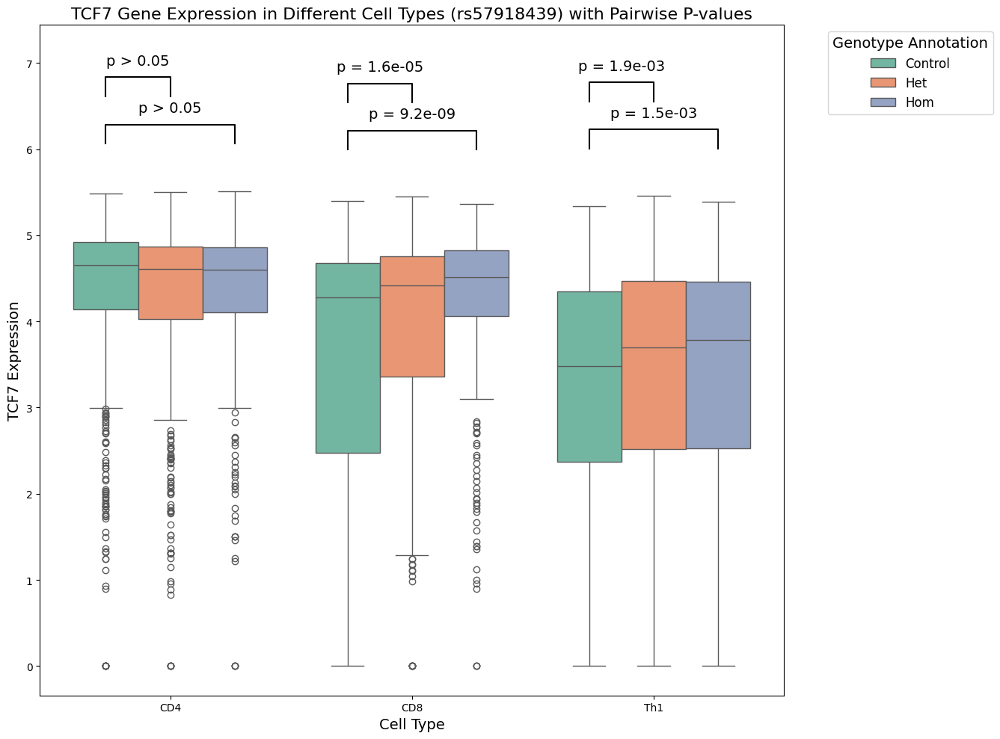

In [10]:
# make the box plot for the TCF7 gene expression in CD4, CD8, and Th1 cells
# For each cell type, we plot the TCF7 gene expression for each genotype as box plots with seaborn

# add the pairwise p-value between control and TCF7_rs57918439_hom_pure, control and TCF7_rs57918439_het_pure, and TCF7_rs57918439_hom_pure and TCF7_rs57918439_het_pure for each cell type
# add the pairwise p-value to the box plot
# import necessary libraries for plotting  
import pandas as pd
import numpy as np
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind # Using t-test for pairwise comparisons

# create the dataframe for the box plot
tcf7_subset.obs["TCF7"] = tcf7_subset[:, "TCF7"].X.toarray().flatten()

# Define the SNP name to be used in the title
snp_name = "rs57918439"

# Define the original genotype names and their desired display names
original_genotype_names = ['AAV_control', 'TCF7_rs57918439_het_pure', 'TCF7_rs57918439_hom_pure']
display_genotype_names = ['Control', 'Het', 'Hom']

# Create a mapping dictionary for renaming categories
genotype_rename_map = dict(zip(original_genotype_names, display_genotype_names))

genotype_order = display_genotype_names
tcf7_subset.obs['genotype_annotation'] = pd.Categorical(
    tcf7_subset.obs['genotype_annotation'].replace(genotype_rename_map), # Replace original names with display names
    categories=genotype_order,
    ordered=True
)



# Define the pairs for p-value computation using the new display names
comparison_pairs = [
    ('Control', 'Hom'),
    ('Control', 'Het'),
    #('Hom', 'Het')
]

# Set the color palette to be more like nature papers
sns.set_palette("Set2")

# Create the box plot
plt.figure(figsize=(16, 10)) # Increased figure size for better p-value visibility
ax = sns.boxplot(
    data=tcf7_subset.obs,
    x="cell_type",
    y="TCF7",
    hue="genotype_annotation",
    palette="Set2",
    dodge=True # Ensure boxes for different hues are dodged
)
# Update the title to include the SNP name
plt.title(f"TCF7 Gene Expression in Different Cell Types ({snp_name}) with Pairwise P-values", fontsize=16) # Increased title fontsize
plt.xlabel("Cell Type", fontsize=14) # Increased x-label fontsize
plt.ylabel("TCF7 Expression", fontsize=14) # Increased y-label fontsize
plt.legend(title="Genotype Annotation", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=14) # Increased legend and title fontsize

# Adjust layout to prevent legend from overlapping
plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust right margin for legend

# Get unique cell types and genotypes for iteration
unique_cell_types = tcf7_subset.obs['cell_type'].unique()
unique_genotypes = tcf7_subset.obs['genotype_annotation'].cat.categories # Use categorical order (now with display names)

# Calculate p-values and annotate the plot
for i, cell_type in enumerate(unique_cell_types):
    # Filter data for the current cell type
    cell_type_data = tcf7_subset.obs[tcf7_subset.obs['cell_type'] == cell_type]

    # Get the x-positions for each genotype within the current cell type group
    num_hues = len(unique_genotypes)
    dodge_width = 0.8 # Default dodge width in seaborn boxplot
    group_width = dodge_width / num_hues
    start_offset = - (dodge_width / 2) + (group_width / 2) # Center of the first box

    genotype_x_positions = {}
    for g_idx, genotype in enumerate(unique_genotypes):
        genotype_x_positions[genotype] = i + start_offset + (g_idx * group_width)

    # Determine a base y-position for annotations for this cell type
    base_y_for_cell_type = cell_type_data['TCF7'].max() if not cell_type_data.empty else 0
    current_y_annotation_level = base_y_for_cell_type + (base_y_for_cell_type * 0.1) # Start 10% above max

    annotation_line_spacing = (base_y_for_cell_type * 0.08) if base_y_for_cell_type > 0 else 0.05

    # Perform pairwise comparisons and add annotations
    for pair_idx, (g1, g2) in enumerate(comparison_pairs):
        data_g1 = cell_type_data[cell_type_data['genotype_annotation'] == g1]['TCF7']
        data_g2 = cell_type_data[cell_type_data['genotype_annotation'] == g2]['TCF7']

        # Only perform test if both groups have data
        if not data_g1.empty and not data_g2.empty:
            stat, p_value = ttest_ind(data_g1, data_g2, nan_policy='omit')

            # Format p-value for display
            if p_value > 0.05:
                p_text = "p > 0.05"
            else:
                p_text = f"p = {p_value:.1e}" # Formats to scientific notation with 1 decimal place

            # Get x-positions for the two genotypes in the pair
            x1 = genotype_x_positions.get(g1)
            x2 = genotype_x_positions.get(g2)

            if x1 is not None and x2 is not None:
                # Adjust y-positions for the connecting line and text
                y_line_start = current_y_annotation_level
                y_line_end = y_line_start + (annotation_line_spacing / 2)
                y_text = y_line_end + (annotation_line_spacing / 4)

                # Draw the connecting line
                ax.plot([x1, x1, x2, x2], [y_line_start, y_line_end, y_line_end, y_line_start],
                        lw=1.5, c='black')

                # Add the p-value text with increased fontsize
                ax.text((x1 + x2) / 2, y_text, p_text, ha='center', va='bottom', color='black', fontsize=14) # Increased fontsize

                # Increment the y-offset for the next annotation in this cell type
                current_y_annotation_level = y_text + annotation_line_spacing / 2

# Adjust y-axis limits to accommodate the p-value annotations
initial_max_y = tcf7_subset.obs['TCF7'].max()
ax.set_ylim(ax.get_ylim()[0], initial_max_y * 1.35) # Add 35% buffer for annotations

plt.savefig("revised_tcf7_boxplot_with_pvalues.svg", dpi=300, bbox_inches='tight')

plt.savefig("revised_tcf7_boxplot_with_pvalues.png", dpi=300, bbox_inches='tight')



In [ ]:
# box plot for each TCF7 probe expression in CD8, variants homo

adata_probe = sc.read("../Data/figure5/TCF7_CD4_8/Annotated_phenotype_hypr_seq_probe.h5ad")

/tmp/ipykernel_36679/1410268643.py:21: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  cd8_adata.obs['genotype_annotation'] = cd8_adata.obs['genotype_annotation'].replace(genotype_rename_map)


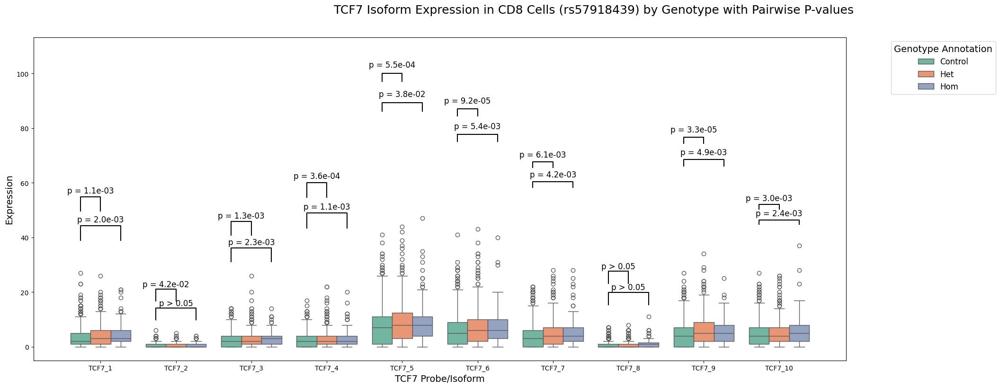

In [13]:
import re
# 1. Subset 'cd8' cells
cd8_adata = adata_probe[adata_probe.obs['cell_type'] == 'CD8'].copy()

# Ensure there are CD8 cells to plot
if cd8_adata.n_obs == 0:
    print("No 'cd8' cells found in adata_probe. Cannot generate plot.")
    # You might want to raise an error or exit here in a real application
else:
    # Define the SNP name to be used in the title
    snp_name = "rs57918439"

    # Define the original genotype names and their desired display names
    original_genotype_names = ['AAV_control', 'TCF7_rs57918439_het_pure', 'TCF7_rs57918439_hom_pure']
    display_genotype_names = ['Control', 'Het', 'Hom']

    # Create a mapping dictionary for renaming categories
    genotype_rename_map = dict(zip(original_genotype_names, display_genotype_names))

    # Apply renaming to the 'genotype_annotation' column
    cd8_adata.obs['genotype_annotation'] = cd8_adata.obs['genotype_annotation'].replace(genotype_rename_map)

    # Define the order of genotypes for consistent plotting and comparison using display names
    genotype_order = display_genotype_names
    cd8_adata.obs['genotype_annotation'] = pd.Categorical(
        cd8_adata.obs['genotype_annotation'],
        categories=genotype_order,
        ordered=True
    )

    # Define the pairs for p-value computation using the new display names
    comparison_pairs = [
        ('Control', 'Hom'),
        ('Control', 'Het'),
        # ('Hom', 'Het')
    ]

    # Identify all TCF7_* probes
    tcf7_probes = [gene for gene in cd8_adata.var_names if gene.startswith('TCF7_')]
    if not tcf7_probes:
        print("No 'TCF7_*' probes found in the 'cd8' subset. Cannot generate plot.")
    else:
        # Prepare data for plotting in long format
        plot_data_list = []
        for probe in tcf7_probes:
            # Extract expression for the current probe
            expression = cd8_adata[:, probe].X.toarray().flatten()
            # Create a temporary DataFrame for this probe
            temp_df = pd.DataFrame({
                'genotype_annotation': cd8_adata.obs['genotype_annotation'],
                'expression': expression,
                'probe_name': probe
            })
            plot_data_list.append(temp_df)

        # Concatenate all probe data into a single DataFrame
        full_plot_df = pd.concat(plot_data_list, ignore_index=True)

        # --- Natural Sorting for Probe Names ---
        def natural_sort_key(s):
            # Split string into parts of numbers and non-numbers
            return [int(c) if c.isdigit() else c.lower() for c in re.split(r'(\d+)', s)]

        probe_order = sorted(tcf7_probes, key=natural_sort_key)
        full_plot_df['probe_name'] = pd.Categorical(
            full_plot_df['probe_name'],
            categories=probe_order,
            ordered=True
        )

        # Set the color palette to be more like nature papers
        sns.set_palette("Set2")

        # Create the single box plot figure
        plt.figure(figsize=(len(tcf7_probes) * 2.5, 8)) # Adjust figure width based on number of probes
        ax = sns.boxplot(
            data=full_plot_df,
            x="probe_name",
            y="expression",
            hue="genotype_annotation",
            palette="Set2",
            dodge=True # Ensure boxes for different hues are dodged
        )

        fig = plt.gcf() # Get current figure
        fig.suptitle(f"TCF7 Isoform Expression in CD8 Cells ({snp_name}) by Genotype with Pairwise P-values",
                     fontsize=18, y=1.02) # Overall title for the figure

        ax.set_xlabel("TCF7 Probe/Isoform", fontsize=14) # X-label for the single plot
        ax.set_ylabel("Expression", fontsize=14) # Y-label for the single plot
        #ax.tick_params(axis='x', rotation=45, ha='right', labelsize=10) # Rotate x-axis labels for readability
        #ax.tick_params(axis='y', labelsize=10) # Adjust y-tick label size

        # Add legend
        ax.legend(title="Genotype Annotation", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=14)

        # Adjust layout to prevent legend from overlapping
        plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust right margin for legend

        # Calculate p-values and annotate the plot
        # Iterate through each probe on the x-axis
        unique_probes_on_plot = full_plot_df['probe_name'].cat.categories

        # Track the highest y-coordinate used by any annotation across all probes
        max_overall_annotation_y = 0

        for i, probe_name in enumerate(unique_probes_on_plot):
            # Filter data for the current probe
            current_probe_df = full_plot_df[full_plot_df['probe_name'] == probe_name]

            # Determine a base y-position for annotations for this probe group
            # Use the max expression for the current probe group
            base_y_for_probe = current_probe_df['expression'].max() if not current_probe_df.empty else 0

            # Define a dynamic spacing, but ensure a minimum absolute spacing
            dynamic_spacing = (base_y_for_probe * 0.08) if base_y_for_probe > 0 else 0.05
            min_absolute_spacing = 0.1 # A fixed minimum spacing in data units
            annotation_line_spacing = max(dynamic_spacing, min_absolute_spacing)

            # Start the first annotation line slightly above the highest box for this group
            current_y_annotation_level = base_y_for_probe + annotation_line_spacing * 1.5

            # Get the x-positions for each genotype within the current probe group
            num_hues = len(genotype_order)
            dodge_width = 0.8 # Default dodge width in seaborn boxplot
            group_width = dodge_width / num_hues
            start_offset = - (dodge_width / 2) + (group_width / 2) # Center of the first box

            genotype_x_positions_on_ax = {}
            for g_idx, genotype in enumerate(genotype_order):
                # The x-position for a group of dodged boxes is 'i' (for probe_name)
                # The offset for each hue within that group depends on the number of hues and dodge width.
                genotype_x_positions_on_ax[genotype] = i + start_offset + (g_idx * group_width)


            for pair_idx, (g1, g2) in enumerate(comparison_pairs):
                data_g1 = current_probe_df[current_probe_df['genotype_annotation'] == g1]['expression']
                data_g2 = current_probe_df[current_probe_df['genotype_annotation'] == g2]['expression']

                if not data_g1.empty and not data_g2.empty:
                    stat, p_value = ttest_ind(data_g1, data_g2, nan_policy='omit')

                    if p_value > 0.05:
                        p_text = "p > 0.05"
                    else:
                        p_text = f"p = {p_value:.1e}"

                    x1 = genotype_x_positions_on_ax.get(g1)
                    x2 = genotype_x_positions_on_ax.get(g2)

                    if x1 is not None and x2 is not None:

                        
                        if annotation_line_spacing < 3:
                            offset = 4
                            y_line_start = current_y_annotation_level + offset/2
                        else:
                            offset = 0
                            y_line_start = current_y_annotation_level
                        
                        y_line_end = y_line_start + (annotation_line_spacing / 2) + offset
                        y_text = y_line_end + (annotation_line_spacing / 4)

                        # Draw the connecting line
                        ax.plot([x1, x1, x2, x2], [y_line_start, y_line_end, y_line_end, y_line_start],
                                lw=1.5, c='black')

                        # Add the p-value text with increased fontsize
                        ax.text((x1 + x2) / 2, y_text, p_text, ha='center', va='bottom', color='black', fontsize=12)

                        current_y_annotation_level = y_text + annotation_line_spacing # Move up for next annotation

            # Update the maximum overall annotation y-coordinate
            max_overall_annotation_y = max(max_overall_annotation_y, current_y_annotation_level)


        # Adjust y-axis limits for the entire plot based on the highest annotation
        current_ylim = ax.get_ylim()
        # Ensure the upper limit is at least max_overall_annotation_y + a small buffer
        ax.set_ylim(current_ylim[0], max(current_ylim[1], max_overall_annotation_y * 1.05)) # Add 5% buffer to highest annotation

        plt.savefig("TCF7_cd8_isoform_boxplot_with_pvalues.svg", dpi=300, bbox_inches='tight')
        plt.savefig("TCF7_cd8_isoform_boxplot_with_pvalues.png", dpi=300, bbox_inches='tight')



In [ ]:
# use cell rank to plot the pseudotime and velocity for the TCF7_CD8 data
import cellrank as cr
import scanpy as sc
import scvelo as scv
sc.settings.set_figure_params(frameon=False, dpi=300)


tcf7_cd4_8 = sc.read("../Data/figure5/TCF7_CD4_8/annotated_genotype_celltype.h5ad")
cd8 = tcf7_cd4_8[tcf7_cd4_8.obs["cell_type"] == "CD8"].copy()



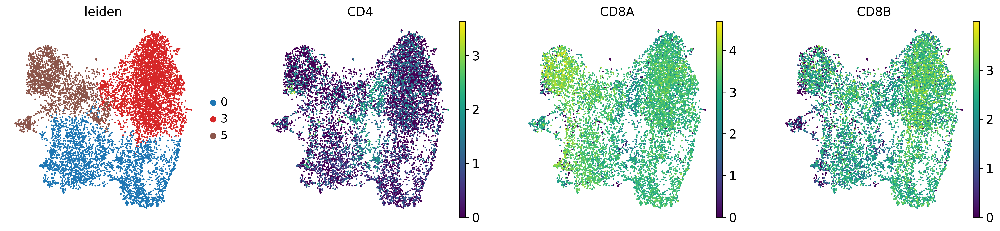

In [30]:
sc.tl.umap(cd8)
sc.pl.umap(cd8, color=["leiden", "CD4", "CD8A", "CD8B"])

In [31]:
sc.pp.filter_genes(cd8, min_cells=10)
scv.pp.normalize_per_cell(cd8)
sc.pp.log1p(cd8)

cd8.layers["spliced"] = cd8.X
cd8.layers["unspliced"] = cd8.X
scv.pp.moments(cd8, n_pcs=30, n_neighbors=30)

computing neighbors


/tmp/ipykernel_36679/2342778711.py:7: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(cd8, n_pcs=30, n_neighbors=30)
/mnt/data/miniconda3/envs/stag/lib/python3.9/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(


    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:02) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [32]:
from cellrank.kernels import CytoTRACEKernel

ctk = CytoTRACEKernel(cd8).compute_cytotrace()

In [33]:
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5)


  0%|          | 0/8457 [00:00<?, ?cell/s]

CytoTRACEKernel[n=8457, dnorm=False, scheme='soft', b=10.0, nu=0.5]

/mnt/data/miniconda3/envs/stag/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/mnt/data/miniconda3/envs/stag/lib/python3.9/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_cytotrace_projection_leiden.svg


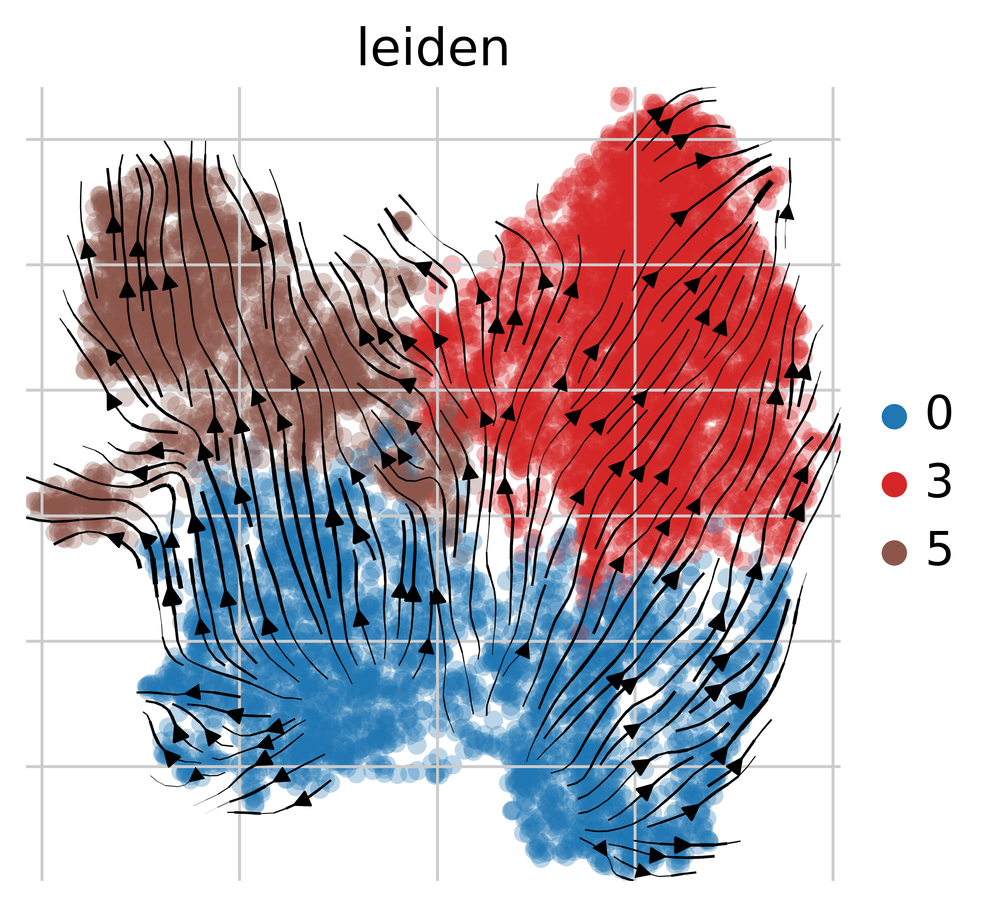

In [37]:
ctk.plot_projection(basis="X_umap", color="leiden", legend_loc="right", save="cytotrace_projection_leiden.svg")


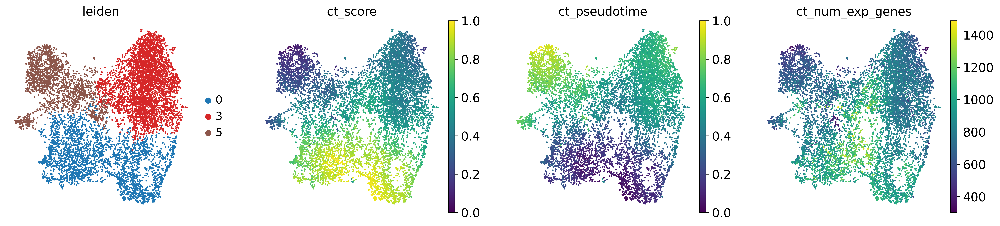

In [38]:
sc.pl.umap(cd8, color=["leiden", "ct_score", "ct_pseudotime", "ct_num_exp_genes"], save="cytotrace_umap.svg")


In [ ]:
markers = "RRM2,SLC29A1,CCNB1,CDK2,MYBL2,H2AX,LMNB1,AURKA,PECAM1,CISH,HAVCR2,BACH2,NELL2,TCF7,LEF1,CCR7,SELL,NKG7,KLRD1,GZMH,GZMB,GZMA,CCR5,IFNG,TBX21,TIGIT,BHLHE40"
markers = markers.split(",")

In [ ]:
# finally, make the heatmap plot to be dot-like

df = pd.read_csv("/mnt/data/project/stag_analysis/analysis_result/TCF7_analysis_result/cluster_by_gene_heatmap/cd8_expression_matrix_norm.csv"
)

# --- Data Preparation ---
# Set 'leiden_cluster' as the index for easier grouping
df_indexed = df.set_index('leiden')

# Calculate the mean expression for each gene within each cluster
# This will be the data used for the heatmap and dot plot
mean_expression_df = df_indexed.groupby('leiden').mean()

# --- 1. Heatmap showing relative expression patterns ---
plt.figure(figsize=(12, 8)) # Adjust figure size as needed
sns.heatmap(
    mean_expression_df,
    cmap='YlGnBu', # Colormap for expression intensity (e.g., 'viridis', 'YlGnBu', 'RdBu_r')
    annot=False, # Set to True if you want to see the actual values on the heatmap
    fmt=".2f", # Format for annotations if annot=True
    linewidths=.5, # Lines between cells
    linecolor='lightgray',
    cbar_kws={'label': 'Mean Expression'} # Color bar label
)
plt.title('Heatmap of Mean Gene Expression Across Leiden Clusters', fontsize=16)
plt.xlabel('Genes', fontsize=14)
plt.ylabel('Leiden Cluster', fontsize=14)
plt.xticks(fontsize=10, rotation=90) # Rotate gene labels for readability
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()
plt.show()

# --- 2. Dot plot showing the same information ---
# For a dot plot, we typically want a long format DataFrame
# Convert mean_expression_df from wide to long format
dot_plot_df = mean_expression_df.reset_index().melt(
    id_vars='leiden',
    var_name='gene',
    value_name='mean_expression'
)

plt.figure(figsize=(8, 14)) # Adjust figure size as needed
sns.scatterplot(
    data=dot_plot_df,
    x='leiden',
    y='gene',
    hue='mean_expression', # Color dots by mean expression
    size='mean_expression', # Size dots by mean expression (optional, but good for emphasis)
    sizes=(100, 600), # Range of dot sizes
    palette='RdBu_r', # Colormap for dot color
    # legend='full', # Show full legend for color and size,
    # swap_axes=False # Keep axes as is for a horizontal dot plot
)
plt.title('Dot Plot of Mean Gene Expression Across Leiden Clusters', fontsize=16)
plt.xlabel('Leiden clusters', fontsize=14)
plt.ylabel('Gene', fontsize=14)
plt.xticks(fontsize=10, rotation=90) # Rotate gene labels for readability
plt.yticks(fontsize=12, rotation=0)

# Move the legend outside the plot for better visibility
plt.legend(title='Mean Expression', bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., fontsize=10, title_fontsize=12)
plt.tight_layout(rect=[0, 0, 0.88, 1]) # Adjust layout to make space for the legend
plt.show()
# plt.savefig("dotplot_mean_expression_leiden.svg", dpi=300, bbox_inches='tight')


AnnData object with n_obs × n_vars = 8457 × 1677
    obs: 'n_counts', 'AAV_control', 'AAV_del', 'TCF7_rs12659489_het_bystander', 'TCF7_rs12659489_het_pure', 'TCF7_rs12659489_hom_bystander', 'TCF7_rs12659489_hom_pure', 'TCF7_rs57918439_het_bystander', 'TCF7_rs57918439_het_pure', 'TCF7_rs57918439_hom_bystander', 'TCF7_rs57918439_hom_pure', 'TCF7_SPA4_het_bystander', 'TCF7_SPA4_het_pure', 'TCF7_SPA4_hom_bystander', 'TCF7_SPA4_hom_pure', 'TCF7_SPA6_het_bystander', 'TCF7_SPA6_het_pure', 'TCF7_SPA6_hom_bystander', 'TCF7_SPA6_hom_pure', 'genotype_annotation', 'leiden', 'cell_type'
    uns: 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

/tmp/ipykernel_91514/2327085805.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  composition = df.groupby([genotype_column, cluster_column]).size().unstack(fill_value=0)


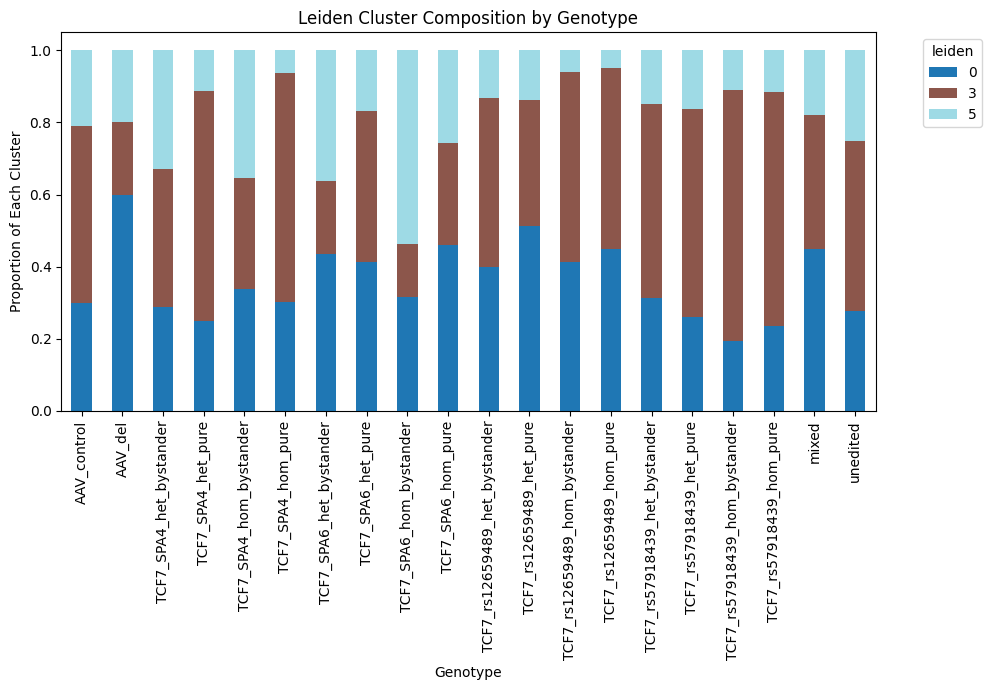

In [4]:
def plot_genotype_cluster_composition(adata, genotype_column='genotype_annotation', cluster_column='leiden', save_path="./", task_name=""):
    """
    Plots the composition of leiden clusters within each genotype as a stacked bar chart.
    
    Parameters:
    - adata: AnnData object containing the data.
    - genotype_column: str, the column in adata.obs representing genotype annotations.
    - cluster_column: str, the column in adata.obs representing leiden cluster labels.
    """
    
    # Extract the relevant columns from adata.obs
    df = adata.obs[[genotype_column, cluster_column]]
    
    # Count the occurrences of each leiden cluster within each genotype
    composition = df.groupby([genotype_column, cluster_column]).size().unstack(fill_value=0)
    
    # Normalize counts to get the proportion of each leiden cluster within each genotype
    composition = composition.div(composition.sum(axis=1), axis=0)
    
    # Plot the composition as a stacked bar chart
    ax = composition.plot(kind='bar', stacked=True, figsize=(10, 7), colormap="tab20")
    
    # Add labels and title
    plt.title('Leiden Cluster Composition by Genotype')
    plt.xlabel('Genotype')
    plt.ylabel('Proportion of Each Cluster')
    plt.legend(title=cluster_column, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

def plot_composition_figure(adata):
    cd4_cell = adata[adata.obs["cell_type"]=="CD4"]
    cd8_cell = adata[adata.obs["cell_type"]=="CD8"]

    save_path = "analysis_result/composition_figures"
    if not os.path.exists(save_path):
        # Create the directory, including any intermediate directories
        os.makedirs(save_path)
    # plot_genotype_cluster_composition(cd4_cell, genotype_column="genotype_annotation", cluster_column="leiden", save_path=f"{save_path}", task_name="cd4")
    plot_genotype_cluster_composition(cd8_cell, genotype_column="genotype_annotation", cluster_column="leiden", save_path=f"{save_path}", task_name="cd8")


plot_composition_figure(tcf7_cd4_8)